## Задание

Выполните задания, используя jupyter.

Для решения итогового проекта выберете наиболее подходящий для вас [датасет](https://lhd8ts4trw.a.trbcdn.net/cdn/yusuciqe45/presentations/data_science/exercise/задания%20для%20итоговой%20аттестации.docx) из списка: [Задания для итоговой аттестации](https://lhd8ts4trw.a.trbcdn.net/cdn/yusuciqe45/presentations/data_science/exercise/задания%20для%20итоговой%20аттестации.docx)

# Вы выбрали Dataset из списка, проведите полный цикл работы над вашим проектом, что проходили ранее. Pipeline выполнения задачи:

1. Загрузка и предобработка данных 

2. Описательный анализ данных, просмотр данных и вывод статистики

3. Постройте необходимые графики для анализа

4. Проверьте гипотезы (если потребуется)

5. Сделайте промежуточный отчет-вывод по исследованию

6. Определите, какую задачу вы будете решать (классификация, регрессия и т.д.)

7. Создайте несколько моделей для прогнозирования вашего целевого признака и выберите наилучшую, опираясь на вашу валидацию

8. Сделайте прогноз для тестовой выборки (должно быть три выборки в этой задаче: тренировочная, валидационная, тестовая)

9. Приведите метрику, с помощью которой вы будете оценивать работу вашей модели (обоснуйте ваш выбор метрики)

10. Сделайте вывод о работе вашей модели и метриках. Обоснуйте: «Нужно ли использовать для решения этой задачи машинное обучение или можно обойтись dummy-предсказанием?»

`Рекомендации:`

- Соблюдайте PEP8

- Комментируйте код в местах, где конструкция большая

- Оставляйте промежуточные выводы по вашему исследованию и построению модели (так кураторам будет проще понять ваши заключения)

- Экспериментируйте! Вы не ограничены в моделях и подходах. Можете использовать любые DS инструменты (и те, которые мы не разбирали с вами на курсе)


<font color="green"> **Для выполнения итоговой работы мной выбрана задача по анализу характеристик бриллиантов и предсказанию их стоимости** </font>

[датасет](https://www.kaggle.com/code/igorprikhodko/diamonds-price-prediction)



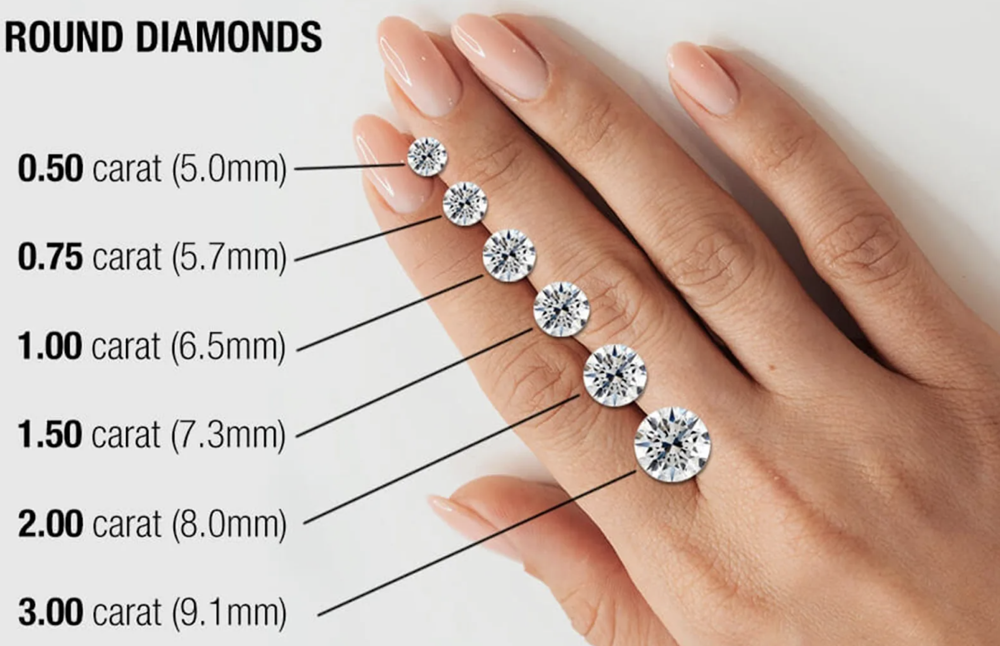

_______________________________________________________________________

 <font color='#87CEEB'><i>Загрузка и предобработка данных </i></font>  

In [34]:
import pandas as pd
import psycopg2

import matplotlib.pyplot as plt
from plotly.subplots import make_subplots
import plotly.graph_objects as go
import plotly.express as px

import seaborn as sns
import numpy as np

from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor, StackingRegressor, ExtraTreesRegressor, GradientBoostingRegressor

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.pipeline import Pipeline

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LinearRegression, Lasso, Ridge, SGDRegressor

from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor
from xgboost import XGBRegressor

np.random.seed(17) # устанавливаем значение для того, чтобы случные числа были одинаковыми

`Для использования знаний полученных в 4ом блоке обучения я создал свой домашний сервер на базе мини PC Shuttle DH110.
В установленном гипервизоре Proxmox развернул базу данных PostgreSQL в LXC контеинере и загрузил в нее целевой датасет 
`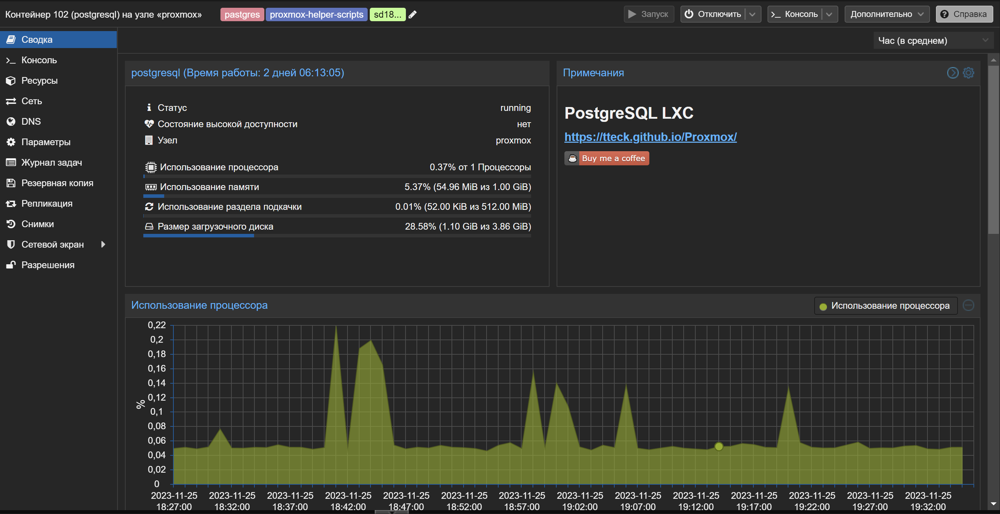

In [35]:
# Подключаемся к таблице из нашей базы данных, создаем Датафрейм
conn = psycopg2.connect(
    host="АДРЕС СЕРВЕРА",
    database="test",
    user="пользователь",
    password="пароль"
)

cur = conn.cursor()
cur.execute("SELECT * FROM diamonds.diamonds")
dataset = cur.fetchall()
columns = [desc[0] for desc in cur.description]
cur.close()
conn.close()

df = pd.DataFrame(dataset, columns=columns)

`Шкала оценки бриллиантов по системе 4C от GIA`

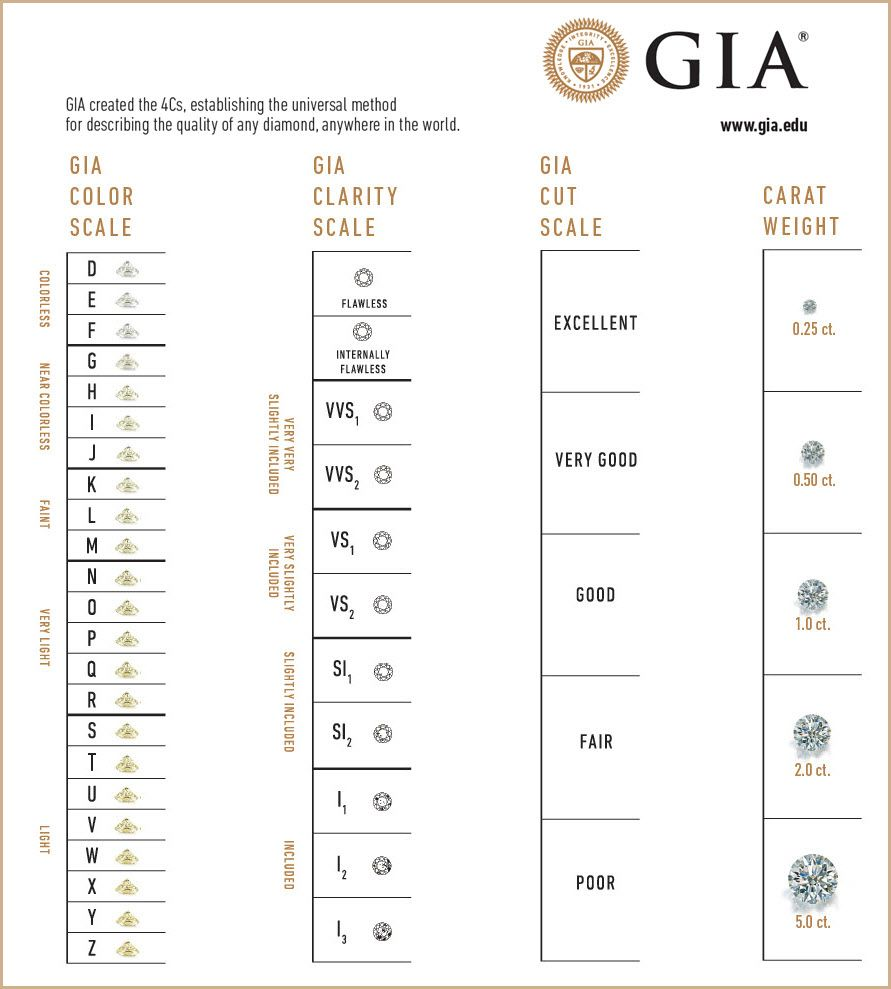

_______________________________________________________________________
<font color='#87CEEB'><i> Описательный анализ данных, просмотр данных и вывод статистики </i></font>

In [36]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   column1  53940 non-null  int64  
 1   carat    53940 non-null  float64
 2   cut      53940 non-null  object 
 3   color    53940 non-null  object 
 4   clarity  53940 non-null  object 
 5   depth    53940 non-null  float64
 6   table    53940 non-null  int64  
 7   price    53940 non-null  int64  
 8   x        53940 non-null  float64
 9   y        53940 non-null  float64
 10  z        53940 non-null  float64
dtypes: float64(5), int64(3), object(3)
memory usage: 4.5+ MB


`Характеристики бриллианта`:
1. карат: вес бриллианта (0,2-5,01)
2. огранка: качество огранки (Fair, Good, Very Good, Premium, Ideal)
3. цвет: цвет бриллианта, от J (худший) до D (лучший)
4. чистота: степень чистоты бриллианта (I1 (худший), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (лучший))
5. глубина: общая глубина в процентах = z / среднее(x, y) = 2 * z / (x + y) (43--79)
6. table: ширина вершины бриллианта относительно самой широкой точки (43--95)
7. цена: цена в долларах США (326-- 18 823 долл.)
8. x - длина в мм (0--10,74)
9. y - ширина в мм (0--58,9)
10. z - глубина в мм (0--31.8)

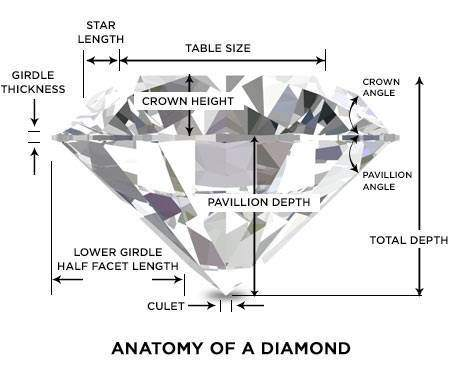

- В представленном наборе данных 11 колонок и  53940 строки. Пропуски в данных - отсутствуют

In [37]:
# колонка column1 представляет из себя индекс она нам не нужна
df.drop(['column1'], axis=1, inplace=True)

In [38]:
df.head(5)

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58,335,4.34,4.35,2.75


`информация и описательные статистические данные`
- посмотрим как распределены данные, их средние значения и стандартное отклонение.

In [39]:
info_df = (pd.DataFrame({'Features':df.columns,'Non Null Count':df.count(), 'Null Count': df.isnull().sum(), 'Datatypes':df.dtypes,})
        .sort_values(by='Datatypes').reset_index(drop = True))
stats = df.describe(include = 'all').T.reset_index()

tota = pd.merge( info_df,stats, right_on = 'index',left_on = 'Features',how = 'inner').drop(columns = ['index', 'count']).round(0)
tota = tota.fillna(0)

colors = ['#FB5B68','#FFEB48','#2676A1','#FFBDB0',]
tota.style.bar(subset = ['mean', 'std', 'min', '25%','50%','75%', 'max'],axis = 1 ,color = colors[2])\
    .format({'mean':"{:20,.0f}", 
             'std':"{:20,.0f}", 
             'min':"{:20,.0f}", 
             '25%':"{:20,.0f}",
             '50%':"{:20,.0f}",
             '75%':"{:20,.0f}", 
             'max':"{:20,.0f}"})\
    .format({"Features": lambda x:  x.upper()},
           )\
    .set_properties(**{'background-color': '#f9f9f9',                                                   
                                    'color': 'black',                       
                                    'border-color': 'white'})

c:\Users\Mi\AppData\Local\Programs\Python\Python310\lib\site-packages\pandas\io\formats\style.py:4052: RuntimeWarning:

invalid value encountered in scalar divide



,Features,Non Null Count,Null Count,Datatypes,unique,top,freq,mean,std,min,25%,50%,75%,max
0,TABLE,53940,0,int64,0,0,0,57.448665,2.239779,43.000000,56.000000,57.000000,59.000000,95.000000
1,PRICE,53940,0,int64,0,0,0,3932.799722,3989.439738,326.000000,950.000000,2401.000000,5324.250000,18823.000000
2,CARAT,53940,0,float64,0,0,0,0.797940,0.474011,0.200000,0.400000,0.700000,1.040000,5.010000
3,DEPTH,53940,0,float64,0,0,0,61.749405,1.432621,43.000000,61.000000,61.800000,62.500000,79.000000
4,X,53940,0,float64,0,0,0,5.731157,1.121761,0.000000,4.710000,5.700000,6.540000,10.740000
5,Y,53940,0,float64,0,0,0,5.734526,1.142135,0.000000,4.720000,5.710000,6.540000,58.900000
6,Z,53940,0,float64,0,0,0,3.538734,0.705699,0.000000,2.910000,3.530000,4.040000,31.800000
7,CUT,53940,0,object,5,Ideal,21551,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
8,COLOR,53940,0,object,7,G,11292,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
9,CLARITY,53940,0,object,8,SI1,13065,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


In [40]:
print(f'Количество дубликатов в DataFrame = {df.duplicated().sum()}')

Количество дубликатов в DataFrame = 146


- удаляем дубликаты

In [41]:
df.drop_duplicates(inplace=True)

In [42]:
df.describe()

,carat,depth,table,price,x,y,z
count,53794.00000,53794.000000,53794.000000,53794.000000,53794.000000,53794.000000,53794.000000
mean,0.79778,61.748080,57.449567,3933.065082,5.731214,5.734653,3.538714
std,0.47339,1.429909,2.238987,3988.114460,1.120695,1.141209,0.705037
min,0.20000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.40000,61.000000,56.000000,951.000000,4.710000,4.720000,2.910000
50%,0.70000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.04000,62.500000,59.000000,5326.750000,6.540000,6.540000,4.030000
max,5.01000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


- в столбцах x, y, z есть нулевые значения. Размер не может быть 0

In [43]:
column_zero_counts = {}
for column in df.columns:
    zero_count = (df[column] == 0).sum()
    column_zero_counts[column] = zero_count

print(column_zero_counts)

{'carat': 0, 'cut': 0, 'color': 0, 'clarity': 0, 'depth': 0, 'table': 0, 'price': 0, 'x': 7, 'y': 6, 'z': 19}


- количество нулевых значений в столбцах - 'x': 8, 'y': 7, 'z': 20 - суммарно 35. Так как это менее 1% удаляем эти значения.

In [44]:
df = df.drop(df[df["x"]==0].index)
df = df.drop(df[df["y"]==0].index)
df = df.drop(df[df["z"]==0].index)

- построим диаграммы размаха для числовых фичей, для определения выбросных значений

In [45]:
cat_columns = []
num_columns = []
for column in df:
    if df[column].dtype == 'object':
        cat_columns.append(column)
    else:
        num_columns.append(column)

fig = make_subplots(rows=(len(df[num_columns].columns)+1), cols=1, vertical_spacing=0.014)

for i, col in enumerate(df[num_columns].columns):
    fig.append_trace(go.Box(x=df[col], name=col, orientation='h'), row=i+1, col=1)
    
fig.append_trace(go.Box(x=pd.to_datetime(df['price'], dayfirst=True).sort_values(ascending=True), name='price', orientation='h'), row=(len(df[num_columns].columns)+1), col=1)

fig.update_layout(height=2000, width=1110, showlegend=False)
fig.show()

In [46]:
df.shape

(53775, 10)

Произведем фильтрацию  по нескольким условиям для столбцов 'depth', 'table', 'x', 'y' и 'z'. Уберем выбросные значения, для более гладкого распределения. \
Хотя конечно это может быть не выброс, а такой уникальный камень.

In [47]:
df = df[(df["carat"]<3.7)&(df["carat"]>0.19)]
df = df[(df["depth"]<73.6)&(df["depth"]>52.2)]
df = df[(df["table"]<71)&(df["table"]>49)]
df = df[(df["x"]<9.66)]
df = df[(df["y"]<10.54)]
df = df[(df["z"]<6.98)]

In [48]:
df.shape

(53745, 10)

`столбцы cut, color, clarity являются категориальными. Требуется их предобработка. Применю два метода Label Encoding и One-Hot-Encoding`

In [49]:
{column: len(df[column].unique()) for column in df.columns if df.dtypes[column] == 'object'}

{'cut': 5, 'color': 7, 'clarity': 8}

In [50]:
# Вывод количества уникальных значений в каждом столбце

unique_counts = ['cut', 'color', 'clarity']
for column in unique_counts:
    unique_values = df[column].value_counts()
    print(f"Столбец: {column}")
    print(unique_values)
    print()

Столбец: cut
cut
Ideal        21482
Premium      13732
Very Good    12065
Good          4888
Fair          1578
Name: count, dtype: int64

Столбец: color
color
G    11250
E     9769
F     9515
H     8263
D     6752
I     5400
J     2796
Name: count, dtype: int64

Столбец: clarity
clarity
SI1     13024
VS2     12220
SI2      9140
VS1      8148
VVS2     5055
VVS1     3646
IF       1784
I1        728
Name: count, dtype: int64



In [ ]:
# Вывод количества уникальных значений в каждом столбце

unique_counts = ['cut', 'color', 'clarity']
for column in unique_counts:
    unique_values = df[column].value_counts()
    print(f"Столбец: {column}")
    print(unique_values)
    print()

Столбец: cut
cut
Ideal        21482
Premium      13732
Very Good    12065
Good          4888
Fair          1578
Name: count, dtype: int64

Столбец: color
color
G    11250
E     9769
F     9515
H     8263
D     6752
I     5400
J     2796
Name: count, dtype: int64

Столбец: clarity
clarity
SI1     13024
VS2     12220
SI2      9140
VS1      8148
VVS2     5055
VVS1     3646
IF       1784
I1        728
Name: count, dtype: int64



`применим Label Encoding к колонкам 'cut', 'color', 'clarity'`

In [51]:
# произведем итерацию по колонкам, содержащим текстовые данные
df_le = df.copy()
for column in df_le.select_dtypes(exclude="number").columns:
    le = LabelEncoder()
    le.fit(df[column])
    df_le[column] = le.transform(df_le[column])

In [52]:
df_le

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,2,1,3,61.5,55,326,3.95,3.98,2.43
1,0.21,3,1,2,59.8,61,326,3.89,3.84,2.31
2,0.23,1,1,4,56.9,65,327,4.05,4.07,2.31
3,0.29,3,5,5,62.4,58,334,4.20,4.23,2.63
4,0.31,1,6,3,63.3,58,335,4.34,4.35,2.75
...,...,...,...,...,...,...,...,...,...,...
53935,0.72,2,0,2,60.8,57,2757,5.75,5.76,3.50
53936,0.72,1,0,2,63.1,55,2757,5.69,5.75,3.61
53937,0.70,4,0,2,62.8,60,2757,5.66,5.68,3.56
53938,0.86,3,4,3,61.0,58,2757,6.15,6.12,3.74


`применим one-hot-encoding к колонкам 'cut', 'color', 'clarity'`

In [53]:
df_c = df.copy()
categorical_columns = ['cut', 'color', 'clarity']
df_ohe = pd.get_dummies(df_c, columns=categorical_columns, dtype=int)

In [54]:
df_ohe

,carat,depth,table,price,x,y,z,cut_Fair,cut_Good,cut_Ideal,...,color_I,color_J,clarity_I1,clarity_IF,clarity_SI1,clarity_SI2,clarity_VS1,clarity_VS2,clarity_VVS1,clarity_VVS2
0,0.23,61.5,55,326,3.95,3.98,2.43,0,0,1,...,0,0,0,0,0,1,0,0,0,0
1,0.21,59.8,61,326,3.89,3.84,2.31,0,0,0,...,0,0,0,0,1,0,0,0,0,0
2,0.23,56.9,65,327,4.05,4.07,2.31,0,1,0,...,0,0,0,0,0,0,1,0,0,0
3,0.29,62.4,58,334,4.20,4.23,2.63,0,0,0,...,1,0,0,0,0,0,0,1,0,0
4,0.31,63.3,58,335,4.34,4.35,2.75,0,1,0,...,0,1,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53935,0.72,60.8,57,2757,5.75,5.76,3.50,0,0,1,...,0,0,0,0,1,0,0,0,0,0
53936,0.72,63.1,55,2757,5.69,5.75,3.61,0,1,0,...,0,0,0,0,1,0,0,0,0,0
53937,0.70,62.8,60,2757,5.66,5.68,3.56,0,0,0,...,0,0,0,0,1,0,0,0,0,0
53938,0.86,61.0,58,2757,6.15,6.12,3.74,0,0,0,...,0,0,0,0,0,1,0,0,0,0


_______________________________________________________________________
<font color='#87CEEB'><i>  Построение необходимых графиков для анализа </i></font>


- Посмотрим на распределения цен по категориям CUT, COLOR, CLARITY

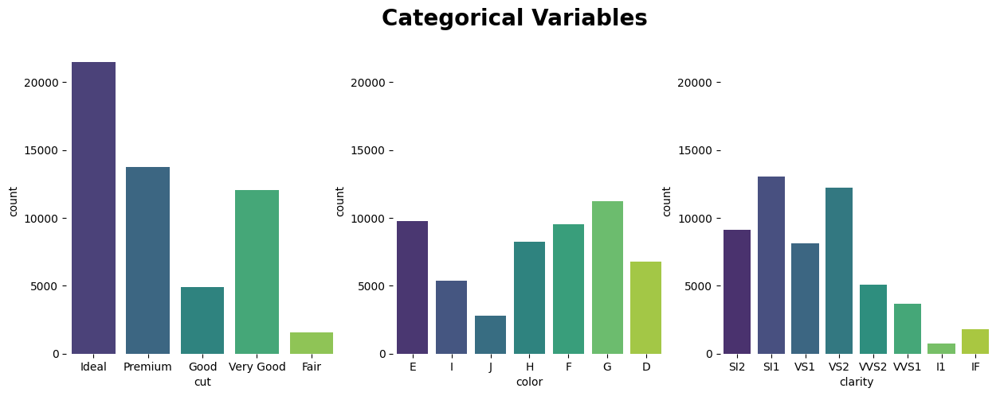

In [55]:
cat_cols = df.select_dtypes(include='object').columns.to_list()
fig = plt.figure(figsize=(15, 5))
plt.suptitle("Categorical Variables", size=20, weight='bold')

ax1 = plt.subplot(131)
sns.countplot(data=df, x=cat_cols[0], ax=ax1, linewidth=2, palette='viridis', hue=cat_cols[0], legend=False)
for s in ['left', 'right', 'top', 'bottom']:
    ax1.spines[s].set_visible(False)

ax2 = plt.subplot(132, sharey=ax1)
sns.countplot(data=df, x=cat_cols[1], ax=ax2, linewidth=2, palette='viridis', hue=cat_cols[1], legend=False)
for s in ['left', 'right', 'top', 'bottom']:
    ax2.spines[s].set_visible(False)

ax3 = plt.subplot(133, sharey=ax1)
sns.countplot(data=df, x=cat_cols[2], ax=ax3, linewidth=2, palette='viridis', hue=cat_cols[2], legend=False)
for s in ['left', 'right', 'top', 'bottom']:
    ax3.spines[s].set_visible(False)

plt.show()

***Карат означает вес камня, а не размер.***

- Вес бриллианта оказывает самое значительное влияние на его цену.

***Поскольку чем больше камень, тем он реже встречается, один бриллиант весом 2 карата будет стоить дороже, чем стоимость двух бриллиантов того же качества весом 1 карат.***

***Карат бриллианта часто очень важен для людей при покупке, но это ошибка - жертвовать качеством ради размера.***

<Axes: xlabel='carat', ylabel='Density'>

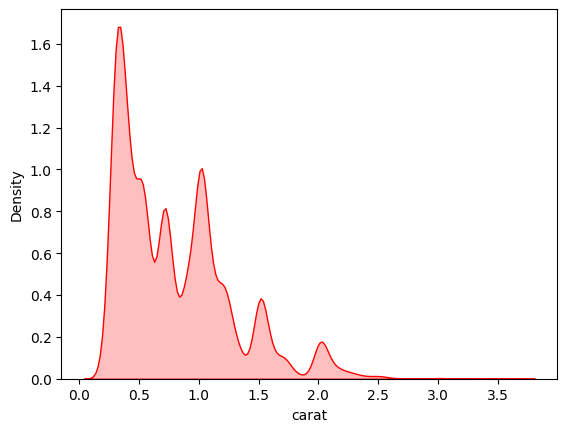

In [56]:
sns.kdeplot(df['carat'], fill=True , color='r')

- Построим график для отображения признаков после Label Encoding 

C:\Users\Mi\AppData\Local\Temp\ipykernel_25832\3172931163.py:2: UserWarning:

To output multiple subplots, the figure containing the passed axes is being cleared.



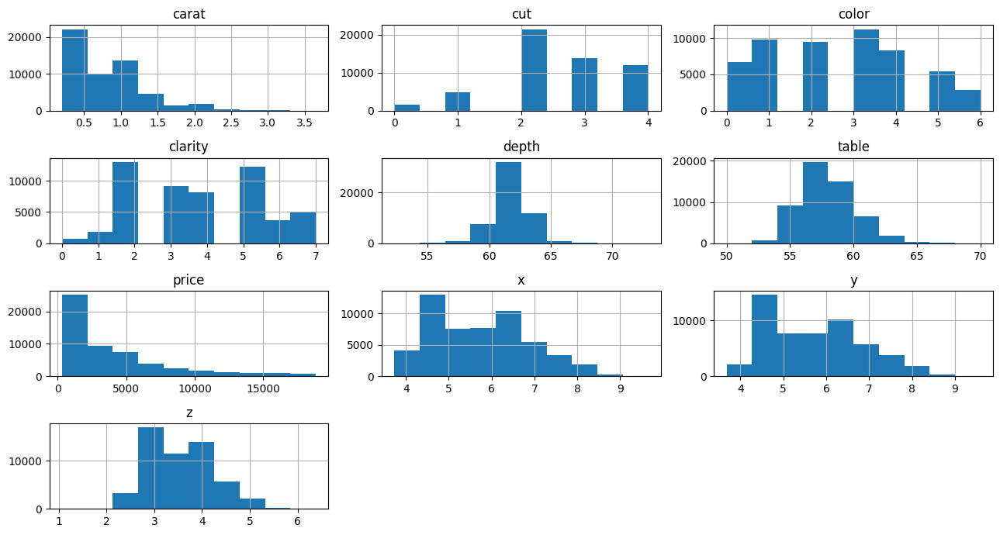

In [57]:
fig, axes = plt.subplots(figsize=(13, 7))
df_le.hist(ax=axes)
plt.tight_layout()
plt.show()

- наблюдаем не симметричные распределения


- Построим матрицу корреляции для датафрейма к которому применен метод One-Hot-Encoding

<Axes: >

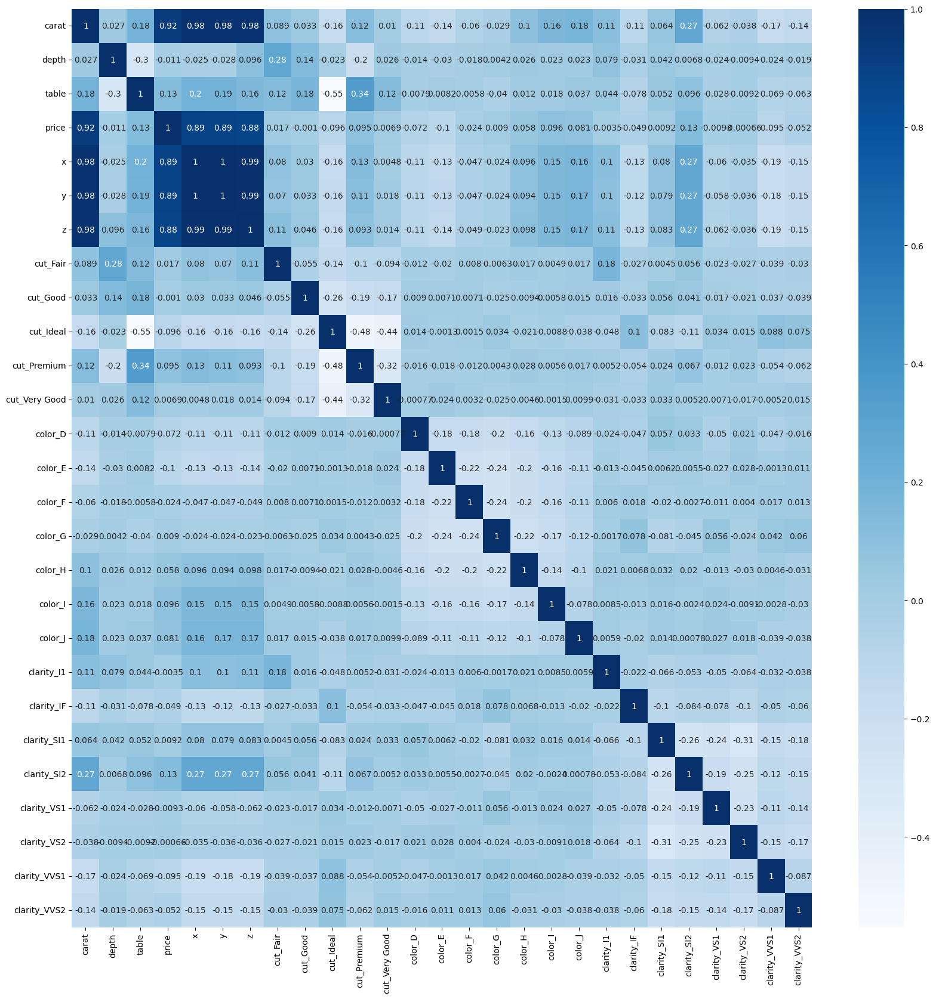

In [58]:
cmap = sns.diverging_palette(70,20,s=50, l=40, n=6,as_cmap=True)
corrmat= df_ohe.corr()
f, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corrmat, annot=True, cmap='Blues')

- Построим матрицу корреляции для датафрейма к которому применен метод Label Encoding 

<Axes: >

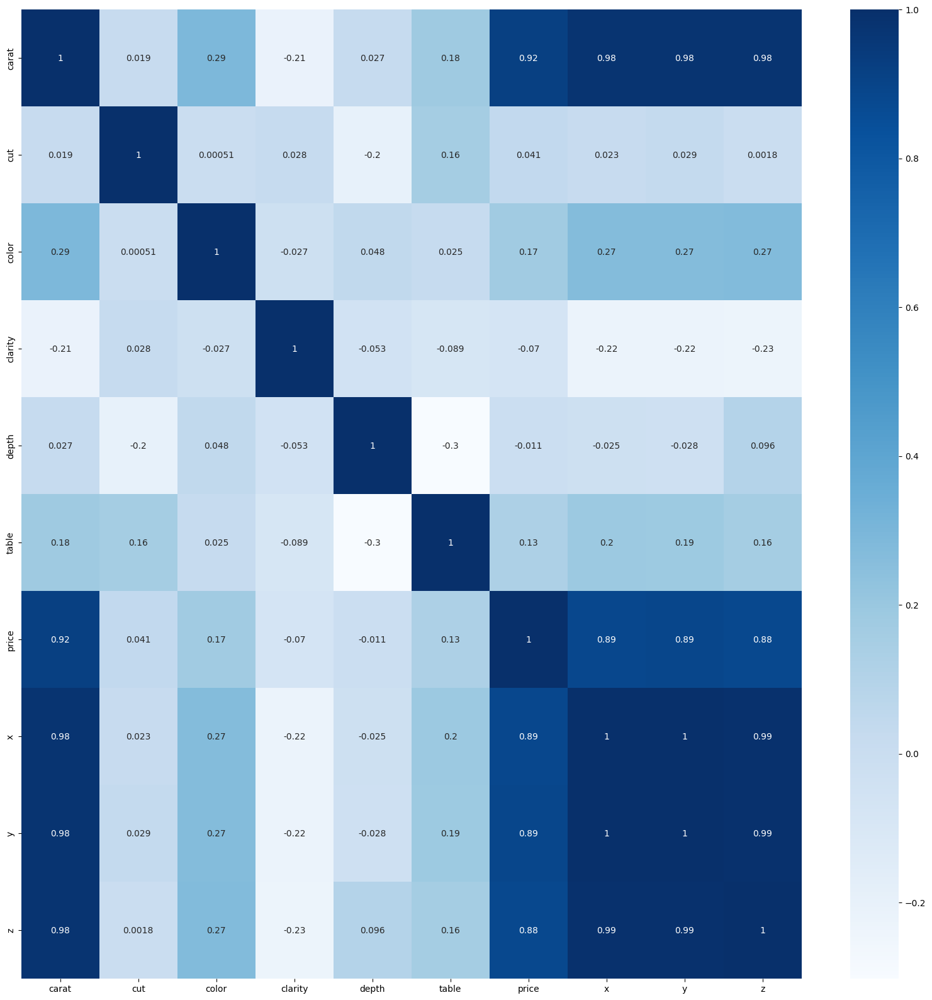

In [59]:
cmap = sns.diverging_palette(70,20,s=50, l=40, n=6,as_cmap=True)
corrmat= df_le.corr()
f, ax = plt.subplots(figsize=(20,20))
sns.heatmap(corrmat, annot=True, cmap='Blues')

- видно как сильно целевой признак коррелирует с фичами X, Y, Z.! Построим точечные диаграммы. И исследуем их.

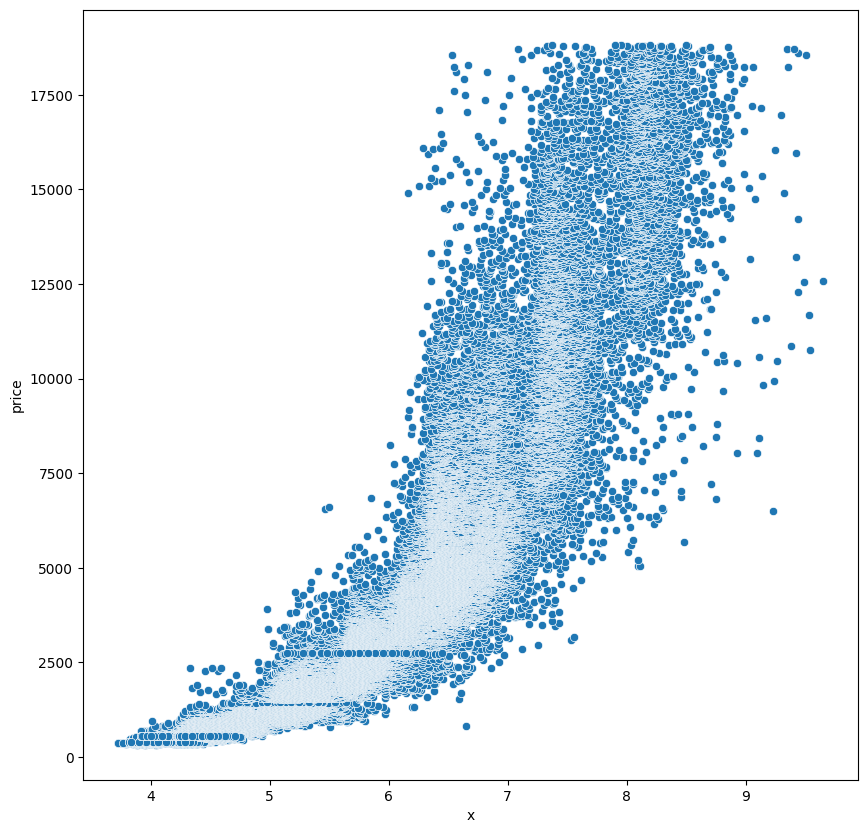

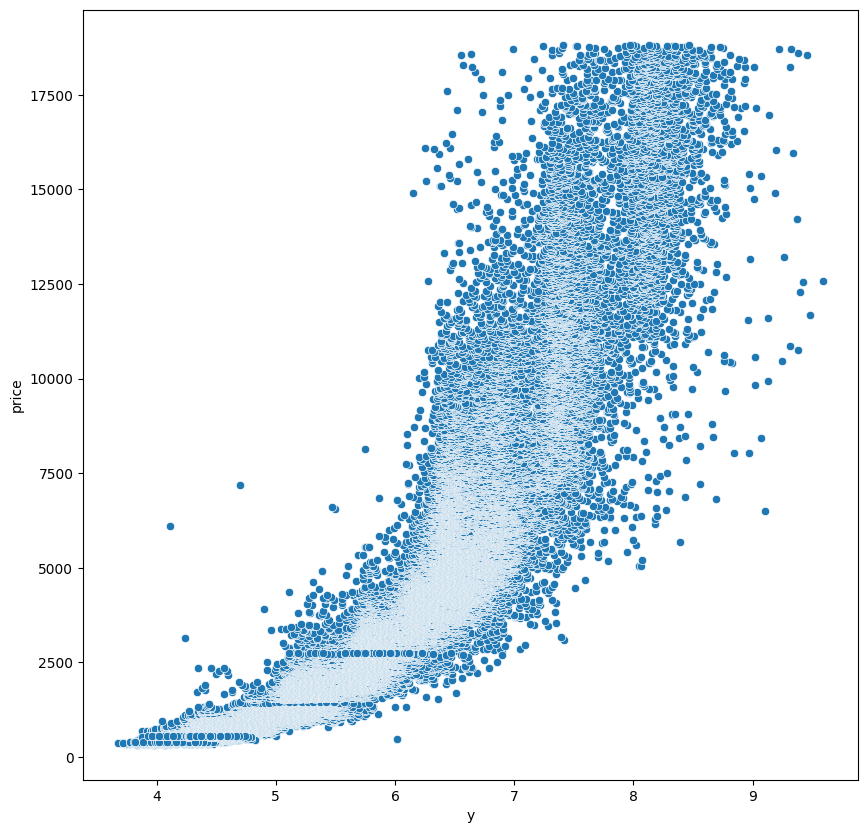

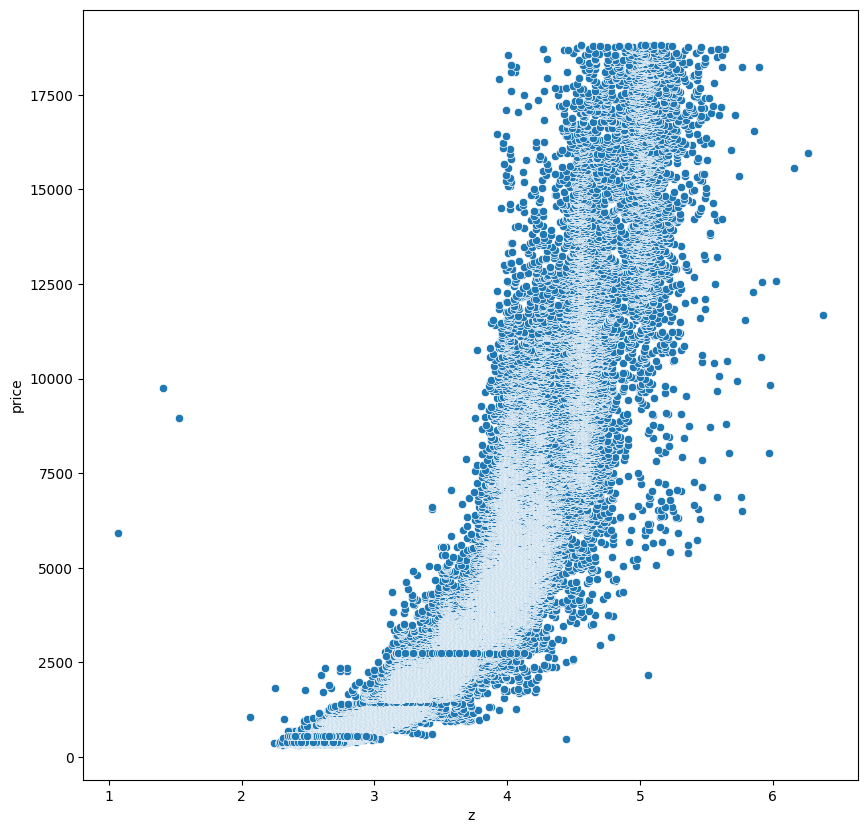

In [60]:
cols = ["x", "y", "z"]
for col in cols:
  plt.figure(figsize=(10, 10))
  sns.scatterplot(x=col, y="price", data=df_ohe)
  plt.show()

`на диаграммах прослеживается линейная зависимость этих признаков. По сути сильная зависимость характеристик размера камня и его цены`

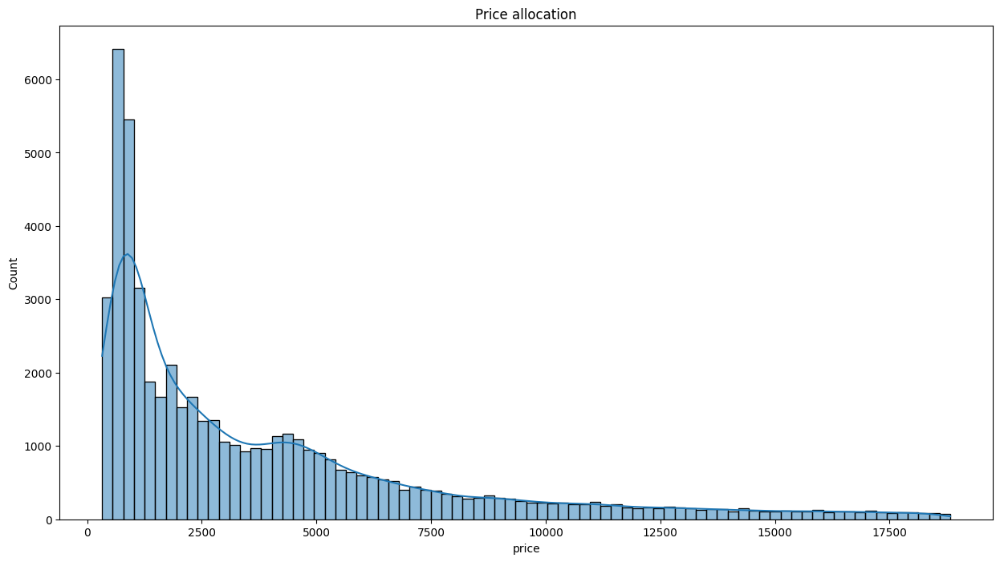

In [61]:
plt.figure(figsize=(15, 8))
sns.histplot(df_ohe["price"], kde=True)

plt.title("Price allocation")
plt.show()

- при более подробном рассмотрении графика цены заметен ценовой диапазон в котором сосредоточено наибольшее  количество бриллиантов.

- `Построим график зависимости качества огранки от цены бриллианта `

<Figure size 1500x1500 with 0 Axes>

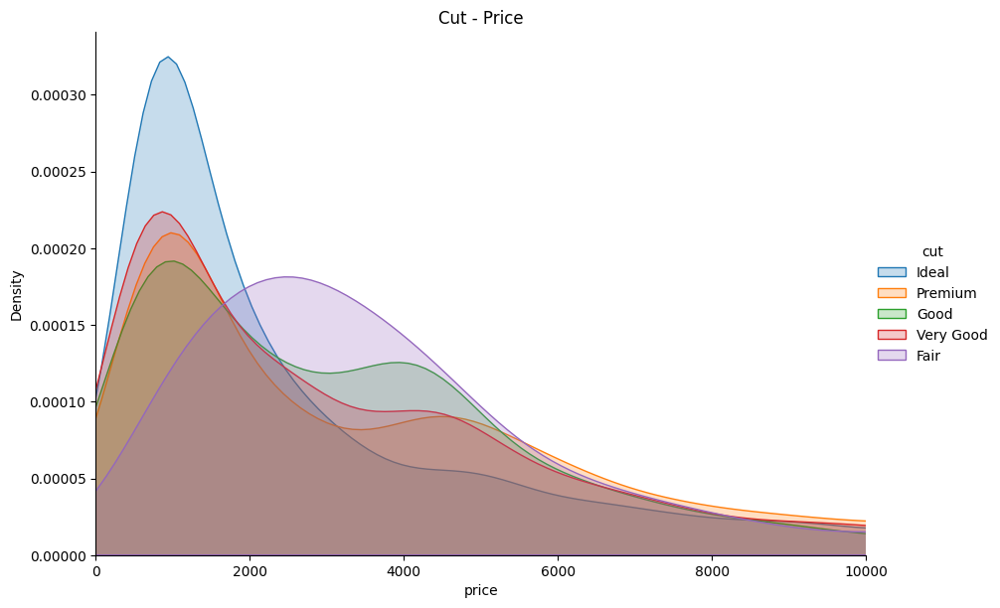

In [62]:
plt.figure(figsize=(15, 15))

sns.FacetGrid(df, hue="cut", height=6, aspect=1.5, xlim=(0, 10000)) \
    .map(sns.kdeplot, "price", fill=True) \
    .add_legend()

plt.title('Cut - Price')
plt.show()

In [63]:
fig = px.scatter(df, x='carat', y='price', trendline='ols')
fig.update_traces(line_color='red')
fig.show()

- наблюдаем частичную линейную зависимость

`Все эти графики подсказывают нам, что наиболее вероятно требуется применять линейные модели и модели на основе деревьев решений.`

_______________________________________________________________________
<font color='#87CEEB'><i> Промежуточный вывод </i></font>


Подгруженные мной данные проанализированы, проведено EDA. Убраны нулевые значения, значения которые сильно выбивались оз общих показателей, убраны дубликаты.\
К данным применено два типа кодирования категориальных признаков (Label Encoding и One Hot Encoding) создано два предобработанных набора данных.\

- все подготовлено к применению машинного обучения.

_______________________________________________________________________
<font color='#87CEEB'><i> Определяю какую задачу буду решать (классификация, регрессия...) </i></font>


`Решаем задачу регрессии `



- При решении задачи буду оценивать качество додели по 3м метрикам:

1. Среднеквадратичная ошибка (Mean Squared Error, MSE): MSE измеряет среднеквадратичное отклонение прогнозов модели от фактических значений. Чем меньше значение MSE, тем лучше модель. Или RMSE (Root Mean Squared Error), которое измеряет среднеквадратичное отклонение прогнозов модели от фактических значений, но возводит его в квадрат(возвращает значение в тех же единицах, что и целевая переменная).

2. Средняя абсолютная ошибка (Mean Absolute Error, MAE): MAE измеряет среднее абсолютное отклонение прогнозов модели от фактических значений. Эта метрика также позволяет оценить точность модели.

3. Коэффициент детерминации (Coefficient of Determination, R^2): R^2 измеряет долю дисперсии зависимой переменной, которую модель объясняет. Значение R^2 находится в диапазоне от 0 до 1, где 1 означает, что модель идеально объясняет данные, а 0 означает, что модель не объясняет никакой дисперсии.


_______________________________________________________________________
<font color='#87CEEB'><i> Создание моделей для прогнозирования целевого признака, выбор наилучшей, опираясь на валидацию </i></font>


- Разделяем набор данных (в данном случае данные с примененным методом `One-Hot-Encoding`) на три выборки:

тренировочная - X_train_ohe\
валидационная - X_val_ohe\
тестовая - X_test_ohe

In [64]:
X_ohe = df_ohe.drop(columns='price')
y_ohe = df_ohe['price']

# Разделение на тренировочную и оставшиеся данные
X_train_ohe, X_remaining_ohe, y_train_ohe, y_remaining_ohe = train_test_split(X_ohe, y_ohe, test_size=0.3, random_state=42)

# Разделение оставшихся данных на валидационную и тестовую выборки
X_val_ohe, X_test_ohe, y_val_ohe, y_test_ohe = train_test_split(X_remaining_ohe, y_remaining_ohe, test_size=0.5, random_state=42)

# Вывод размерности полученных выборок
print("Размер тренировочной выборки:", X_train_ohe.shape)
print("Размер валидационной выборки:", X_val_ohe.shape)
print("Размер тестовой выборки:", X_test_ohe.shape)

Размер тренировочной выборки: (37621, 26)
Размер валидационной выборки: (8062, 26)
Размер тестовой выборки: (8062, 26)


- Разделяем набор данных (в данном случае данные с примененным методом `Lable-Encoding`) на три выборки:

тренировочная - X_train_le\
валидационная - X_val_le\
тестовая - X_test_le

In [65]:
X_le= df_le.drop(columns='price')
y_le = df_le['price']

# Разделение на тренировочную и оставшиеся данные
X_train_le, X_remaining_le, y_train_le, y_remaining_le = train_test_split(X_le, y_le, test_size=0.3, random_state=42)

# Разделение оставшихся данных на валидационную и тестовую выборки
X_val_le, X_test_le, y_val_le, y_test_le = train_test_split(X_remaining_le, y_remaining_le, test_size=0.5, random_state=42)

# Вывод размерности полученных выборок
print("Размер тренировочной выборки:", X_train_le.shape)
print("Размер валидационной выборки:", X_val_le.shape)
print("Размер тестовой выборки:", X_test_le.shape)


Размер тренировочной выборки: (37621, 9)
Размер валидационной выборки: (8062, 9)
Размер тестовой выборки: (8062, 9)


----------------

- `Создам свой стэк из моделей`

In [66]:
seed = 42
estimators = [
('LGBM' , LGBMRegressor(boosting_type =  'gbdt',
                            class_weight = 'balanced', 
                            importance_type =  'split', 
                            learning_rate =  0.05,
                            n_estimators =  300,
                            num_leaves = 31, 
                            objective = 'regression', 
                            random_state = 32)),
('Cat' , CatBoostRegressor(depth = 6, iterations = 1850, learning_rate = 0.09 )),
('rf' ,  RandomForestRegressor(n_jobs = -1, random_state = seed)),
('et' , ExtraTreesRegressor(n_jobs = -1, random_state = seed)),
('gb' , GradientBoostingRegressor(random_state = seed)),
('xgb' , XGBRegressor(objective='reg:squarederror', 
                         base_score=0.8 , 
                         booster = 'gbtree' , 
                         learning_rate=0.05, 
                         max_depth= 8 , 
                         n_estimators=300 , 
                         random_state=32 ))
 ]
reg = StackingRegressor(
    estimators=estimators,
     final_estimator= LinearRegression(n_jobs = -1),
       cv= 5 , verbose = 2 , passthrough = True 
)

- создам переменные с моделями

In [67]:
pipe0 = Pipeline([('scaler',StandardScaler()), ('DummyClassifier', DummyClassifier(strategy="most_frequent"))])
pipe1 = Pipeline([('scaler',StandardScaler()), ('linearReg', LinearRegression())])
pipe2 = Pipeline([('scaler',StandardScaler()), ('LassoReg', Lasso(alpha = 0.0005,max_iter = 1000))])
pipe3 = Pipeline([('scaler',StandardScaler()), ('RidgeReg', Ridge())])
pipe4 = Pipeline([('scaler',StandardScaler()), ('SGDReg', SGDRegressor())])
pipe5 = Pipeline([('scaler',StandardScaler()), ('RFReg', RandomForestRegressor(n_estimators = 200,max_depth=15))])
pipe6 = Pipeline([('scaler',StandardScaler()), ('DTReg', DecisionTreeRegressor())])
pipe7 = Pipeline([('scaler',StandardScaler()), ('KNNReg', KNeighborsRegressor())])
pipe8 = Pipeline([('scaler',StandardScaler()), ('XGBReg', XGBRegressor(n_estimators = 300, importance_type = 'gain'))])
pipe9 = Pipeline([('scaler',StandardScaler()), ('KNNReg', LGBMRegressor(n_estimators = 300, objective ='regression', importance_type = 'split'))])
pipe10 = Pipeline([('scaler',StandardScaler()), ('StackingRegressor', StackingRegressor(estimators=estimators))])

In [68]:
myPipes_ohe = [pipe0,pipe1,pipe2,pipe3,pipe4,pipe5,pipe6,pipe7,pipe8,pipe9,pipe10]
ypreds_ohe = []
for pipe in myPipes_ohe:
    start_time = np.datetime64('now')
    pipe.fit(X_train_ohe,y_train_ohe)
    ypreds_ohe.append(pipe.predict(X_test_ohe))
    period = pd.Timedelta(np.datetime64('now')-start_time).total_seconds()
    modelname = str(pipe[-1]).split('(')[0]
    print(f'fitting model {modelname} took {period} seconds', '\n', '-'*50)

fitting model DummyClassifier took 0.0 seconds 
 --------------------------------------------------
fitting model LinearRegression took 0.0 seconds 
 --------------------------------------------------


c:\Users\Mi\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.344e+10, tolerance: 6.052e+07



fitting model Lasso took 4.0 seconds 
 --------------------------------------------------
fitting model Ridge took 0.0 seconds 
 --------------------------------------------------
fitting model SGDRegressor took 0.0 seconds 
 --------------------------------------------------
fitting model RandomForestRegressor took 36.0 seconds 
 --------------------------------------------------
fitting model DecisionTreeRegressor took 1.0 seconds 
 --------------------------------------------------
fitting model KNeighborsRegressor took 0.0 seconds 
 --------------------------------------------------
fitting model XGBRegressor took 3.0 seconds 
 --------------------------------------------------
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.005850 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1233
[LightGBM] [Info] Number of data points in the train set: 37621, number of used features: 26
[LightGBM] [Info] St


 ============================== by using metric of mean_absolute_error ============================== 

     DummyClassifier 	 : 3124.421359464153
    LinearRegression 	 : 723.0104762177253
               Lasso 	 : 722.5666531531675
               Ridge 	 : 722.8863278418786
        SGDRegressor 	 : 725.3190592505632
RandomForestRegressor 	 : 274.9830833871935
DecisionTreeRegressor 	 : 365.82324485239394
 KNeighborsRegressor 	 : 420.6652691639792
        XGBRegressor 	 : 279.90538110830033
       LGBMRegressor 	 : 271.98854311493034
   StackingRegressor 	 : 257.8913333320982


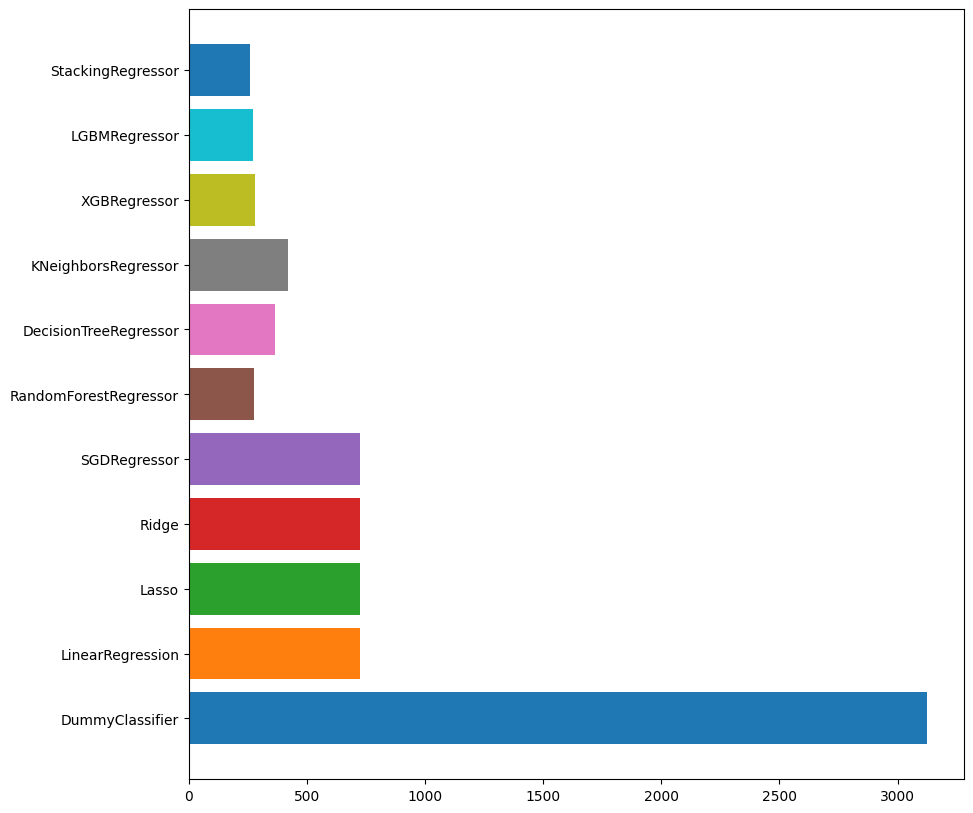


 ============================== by using metric of mean_squared_error =============================== 

     DummyClassifier 	 : 24657054.023939468
    LinearRegression 	 : 1130814.20643244
               Lasso 	 : 1130750.1935896783
               Ridge 	 : 1130440.0530150454
        SGDRegressor 	 : 1137398.2315786134
RandomForestRegressor 	 : 290608.71265911777
DecisionTreeRegressor 	 : 568041.676817167
 KNeighborsRegressor 	 : 684824.0070503596
        XGBRegressor 	 : 314506.0589830051
       LGBMRegressor 	 : 274803.93678083195
   StackingRegressor 	 : 262734.09815355117


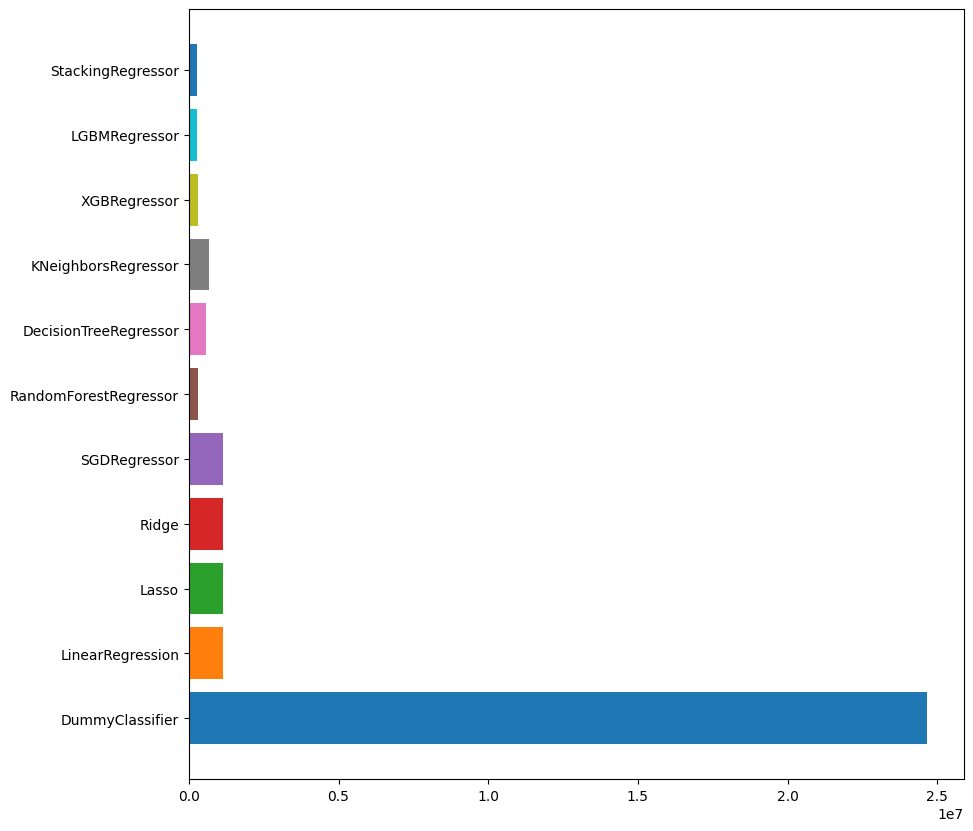


 =================================== by using metric of r2_score ==================================== 

     DummyClassifier 	 : 0.0
    LinearRegression 	 : 0.9211186541087404
               Lasso 	 : 0.9211300443364403
               Ridge 	 : 0.9211463668982456
        SGDRegressor 	 : 0.9230140994416645
RandomForestRegressor 	 : 0.9809574054802194
DecisionTreeRegressor 	 : 0.9634590313125844
 KNeighborsRegressor 	 : 0.9515310832199624
        XGBRegressor 	 : 0.9794568085903714
       LGBMRegressor 	 : 0.9820254291136975
   StackingRegressor 	 : 0.9828771933544028


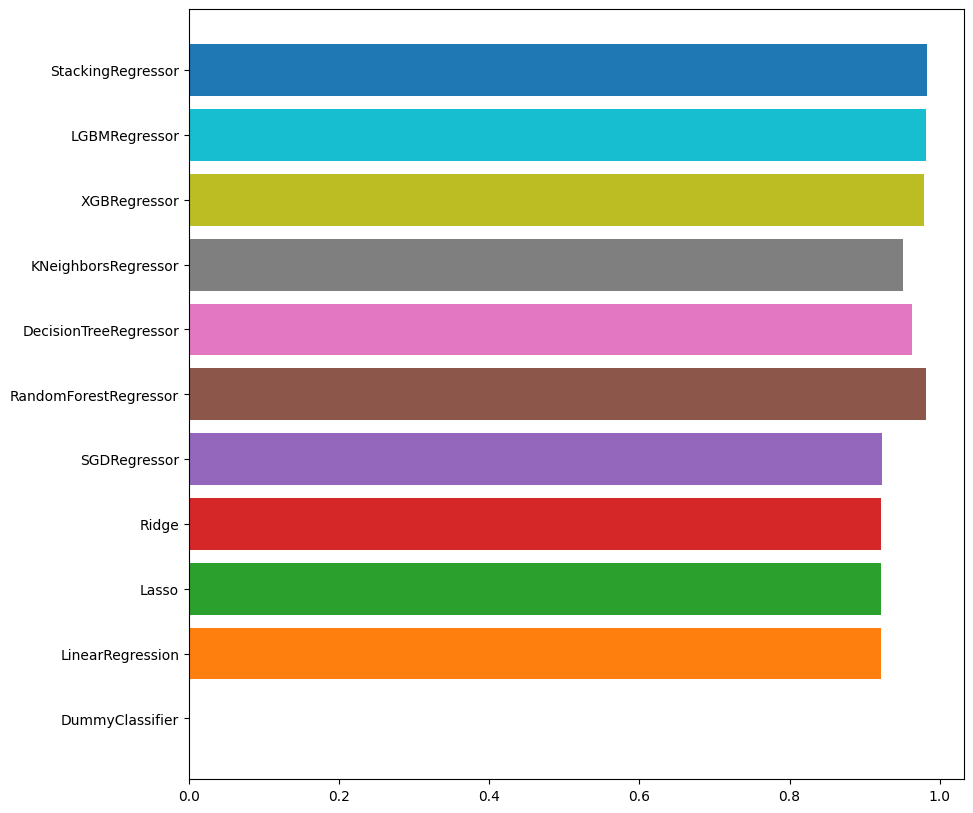

In [69]:
results = dict
for i in [mean_absolute_error, mean_squared_error, r2_score]:
    plt.subplots(figsize=(10,10))
    metric_name = str(i).split()[1]
    print('\n',f' by using metric of {metric_name} '.center(100,'='),'\n')
    for j in range(len(myPipes_ohe)):
        score=i(ypreds_ohe[j],y_test_ohe)
        modelname = str(myPipes_ohe[j][-1]).split('(')[0]
        print(modelname.rjust(20),'\t :', score)
        plt.barh(modelname,score)
    plt.show()

- Проверим точность лучшей модели (StackingRegressor) примененной к данным с One-Hot-Encoding на валидационной части данных.

In [70]:
model = myPipes_ohe[10]
y_pred_val = model.predict(X_val_ohe)

# Оценка точности модели на валидационных данных 
accuracy_mae = mean_absolute_error(y_val_ohe, y_pred_val)
accuracy_mse = mean_squared_error(y_val_ohe, y_pred_val)
accuracy_r2 = r2_score(y_val_ohe, y_pred_val)
print("Точность модели StackingRegressor по метрике mean_absolute_error на валидационных данных с применением one-Hot-Encoding:", accuracy_mae)
print("Точность модели StackingRegressor по метрике mean_squared_error на валидационных данных с применением one-Hot-Encoding:", accuracy_mse)
print("Точность модели StackingRegressor по метрике r2_score на валидационных данных с применением one-Hot-Encoding:", accuracy_r2)

Точность модели StackingRegressor по метрике mean_absolute_error на валидационных данных с применением one-Hot-Encoding: 256.05130657101824
Точность модели StackingRegressor по метрике mean_squared_error на валидационных данных с применением one-Hot-Encoding: 249673.60941049224
Точность модели StackingRegressor по метрике r2_score на валидационных данных с применением one-Hot-Encoding: 0.9836924669643302


------------------

In [71]:
myPipes_le = [pipe0,pipe1,pipe2,pipe3,pipe4,pipe5,pipe6,pipe7,pipe8,pipe9,pipe10]
ypreds_le = []
for pipe in myPipes_le:
    start_time = np.datetime64('now')
    pipe.fit(X_train_le,y_train_le)
    ypreds_le.append(pipe.predict(X_test_le))
    period = pd.Timedelta(np.datetime64('now')-start_time).total_seconds()
    modelname = str(pipe[-1]).split('(')[0]
    print(f'fitting model {modelname} took {period} seconds', '\n', '-'*50)

fitting model DummyClassifier took 0.0 seconds 
 --------------------------------------------------
fitting model LinearRegression took 0.0 seconds 
 --------------------------------------------------


c:\Users\Mi\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:628: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.347e+10, tolerance: 6.052e+07



fitting model Lasso took 1.0 seconds 
 --------------------------------------------------
fitting model Ridge took 0.0 seconds 
 --------------------------------------------------
fitting model SGDRegressor took 1.0 seconds 
 --------------------------------------------------
fitting model RandomForestRegressor took 32.0 seconds 
 --------------------------------------------------
fitting model DecisionTreeRegressor took 0.0 seconds 
 --------------------------------------------------
fitting model KNeighborsRegressor took 0.0 seconds 
 --------------------------------------------------
fitting model XGBRegressor took 1.0 seconds 
 --------------------------------------------------
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000666 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1196
[LightGBM] [Info] Number of data points in the tr


 ============================== by using metric of mean_absolute_error ============================== 

     DummyClassifier 	 : 3124.421359464153
    LinearRegression 	 : 841.5745362903414
               Lasso 	 : 840.9188040702368
               Ridge 	 : 841.5187746846073
        SGDRegressor 	 : 842.1345162266566
RandomForestRegressor 	 : 268.02865682861903
DecisionTreeRegressor 	 : 367.1530637558918
 KNeighborsRegressor 	 : 399.346663358968
        XGBRegressor 	 : 277.1972681801185
       LGBMRegressor 	 : 266.58922483970645
   StackingRegressor 	 : 254.70118528230327


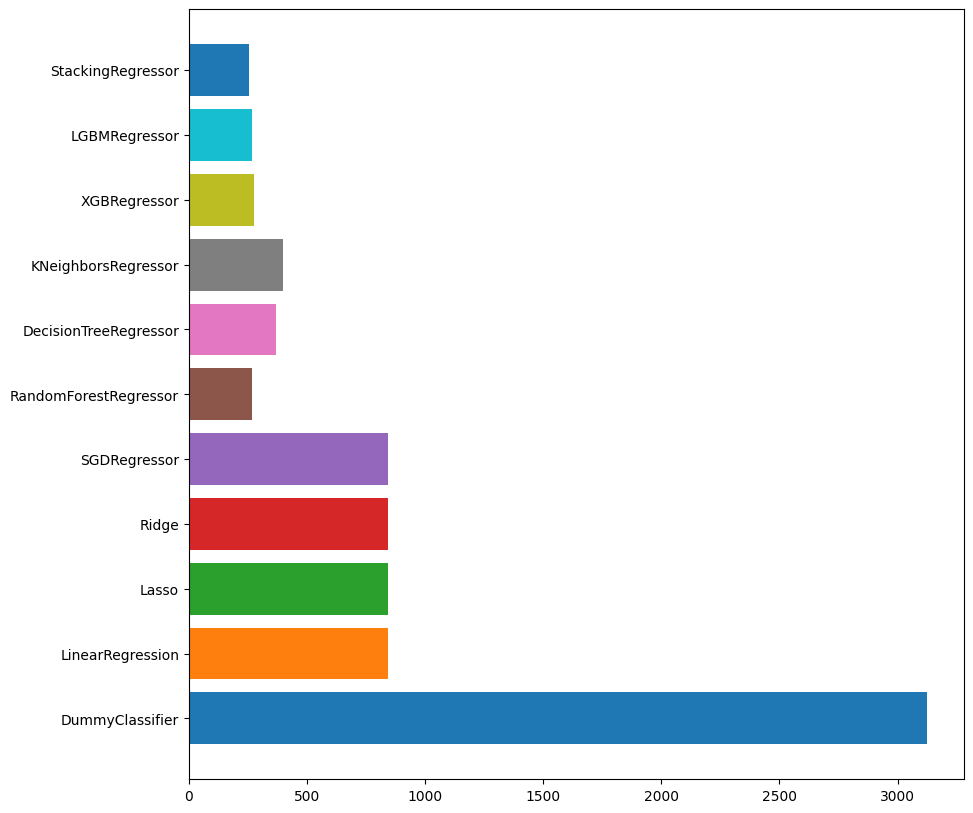


 ============================== by using metric of mean_squared_error =============================== 

     DummyClassifier 	 : 24657054.023939468
    LinearRegression 	 : 1632745.082049045
               Lasso 	 : 1633675.5884922715
               Ridge 	 : 1632596.7363012102
        SGDRegressor 	 : 1636997.738995248
RandomForestRegressor 	 : 284157.3664270175
DecisionTreeRegressor 	 : 580972.2612875217
 KNeighborsRegressor 	 : 589456.1102555197
        XGBRegressor 	 : 309427.97429637186
       LGBMRegressor 	 : 269746.1309601505
   StackingRegressor 	 : 256513.02261200096


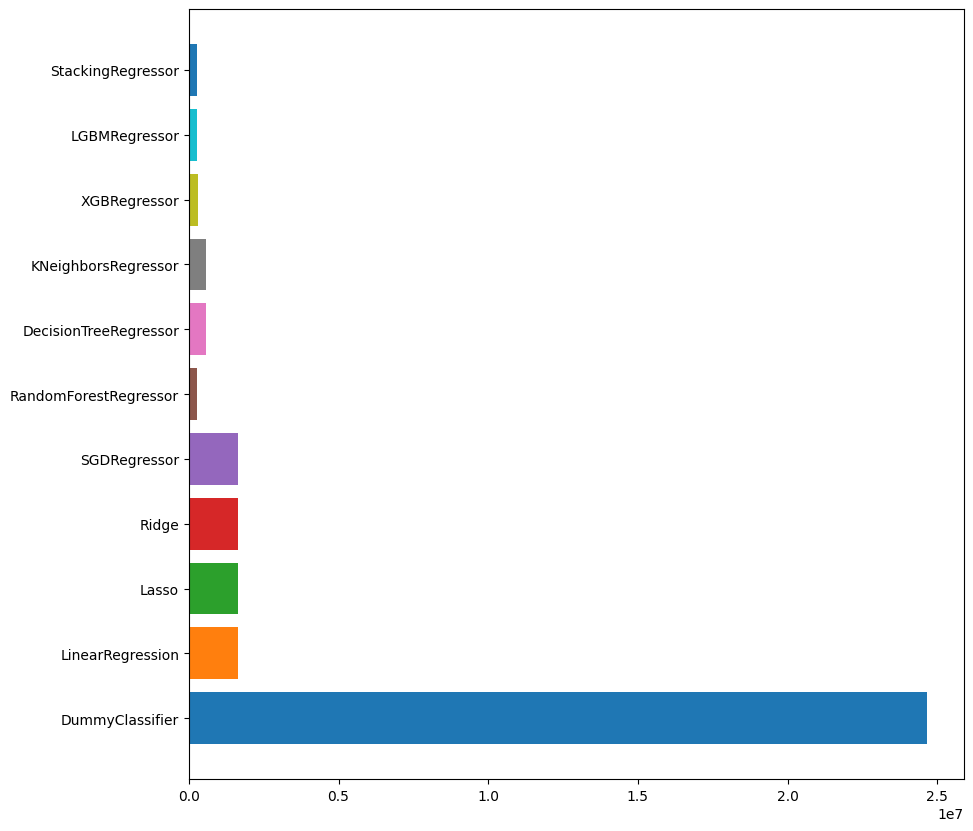


 =================================== by using metric of r2_score ==================================== 

     DummyClassifier 	 : 0.0
    LinearRegression 	 : 0.8817789456259668
               Lasso 	 : 0.8816963960401204
               Ridge 	 : 0.8817725795903896
        SGDRegressor 	 : 0.882476176750692
RandomForestRegressor 	 : 0.9813787523190735
DecisionTreeRegressor 	 : 0.9626787782407136
 KNeighborsRegressor 	 : 0.959704334273471
        XGBRegressor 	 : 0.9798076914500278
       LGBMRegressor 	 : 0.9823332825009993
   StackingRegressor 	 : 0.9832324800309455


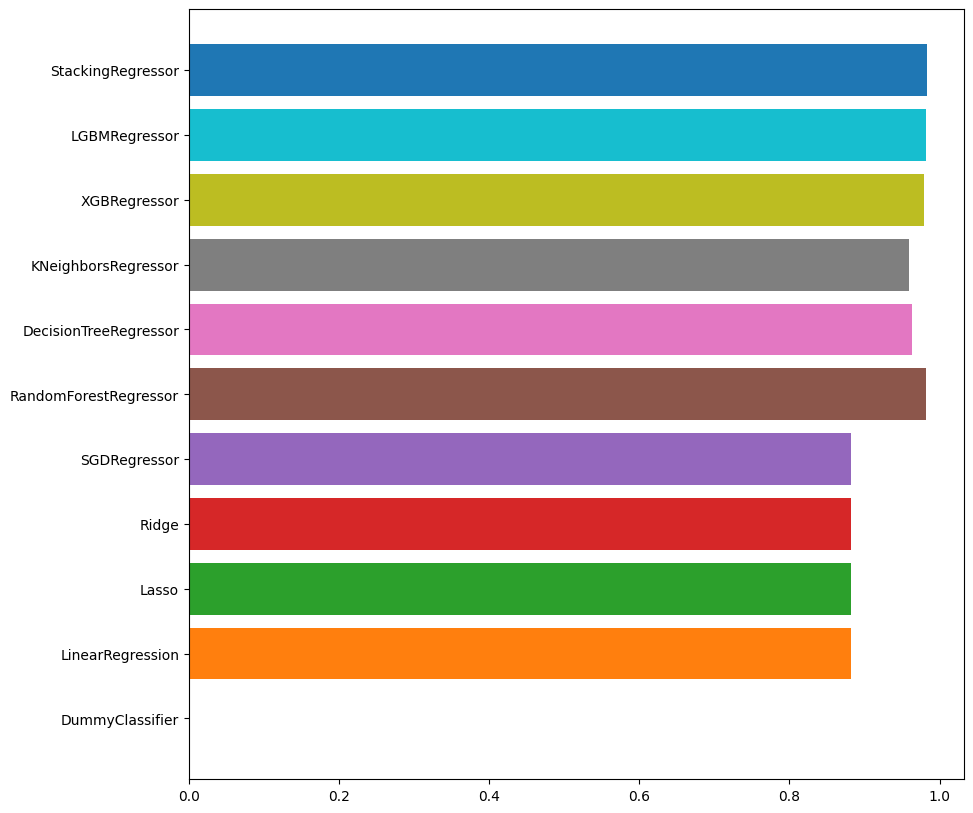

In [72]:
results = dict
for i in [mean_absolute_error, mean_squared_error, r2_score]:
    plt.subplots(figsize=(10,10))
    metric_name = str(i).split()[1]
    print('\n',f' by using metric of {metric_name} '.center(100,'='),'\n')
    for j in range(len(myPipes_le)):
        score=i(ypreds_le[j],y_test_le)
        modelname = str(myPipes_le[j][-1]).split('(')[0]
        print(modelname.rjust(20),'\t :', score)
        plt.barh(modelname,score)
    plt.show()

- Проверим точность лучшей модели (StackingRegressor) примененной к данным с Lable-Encoding на валидационной части данных.

In [74]:
model = myPipes_le[10]
y_pred_val = model.predict(X_val_le)

# Оценка точности модели на валидационных данных 
accuracy_mae = mean_absolute_error(y_val_le, y_pred_val)
accuracy_mse = mean_squared_error(y_val_le, y_pred_val)
accuracy_r2 = r2_score(y_val_le, y_pred_val)
print("Точность модели StackingRegressor по метрике mean_absolute_error на валидационных данных с применением Lable-Encoding:", accuracy_mae)
print("Точность модели StackingRegressor по метрике mean_squared_error на валидационных данных с применением Lable-Encoding:", accuracy_mse)
print("Точность модели StackingRegressor по метрике r2_score на валидационных данных с применением Lable-Encoding:", accuracy_r2)

Точность модели StackingRegressor по метрике mean_absolute_error на валидационных данных с применением Lable-Encoding: 252.61416002911315
Точность модели StackingRegressor по метрике mean_squared_error на валидационных данных с применением Lable-Encoding: 241574.621606029
Точность модели StackingRegressor по метрике r2_score на валидационных данных с применением Lable-Encoding: 0.9842214556367358


_______________________________________________________________________
<font color='#87CEEB'><i> Вывод о работе модели и метриках.\
 Обосновываю вопрос: «Нужно ли использовать для решения этой задачи машинное обучение или можно обойтись dummy-предсказанием?» </i></font>


`Dummy-предсказанием для решения данной задачи обойтись нельзя! И представленные выше графики исследования это доказывают!`\
`Для решения данной задачи требуется использовать методы машинного обучения.`

Точность модели `StackingRegressor` (на валидационных данных с применением `one-Hot-Encoding`):\
по метрике mean_absolute_error : 256.05130657101824\
по метрике mean_squared_error: 249673.60941049224\
по метрике r2_score: 0.9836924669643302

Точность модели `StackingRegressor` (на валидационных данных с применением `Lable-Encoding`):\
по метрике mean_absolute_error : `252.61416002911315`\
по метрике mean_squared_error: `241574.621606029`\
по метрике r2_score: `0.9842214556367358`

- Как видно из результатов тестирования самой лучшей модели на валидационной части данных, наиболее качественно модель обработала датасет с примененным методом Lable-Encoding. Хотя и различия не такие большие, но они есть! 

- Предобработка данных, их понимание позволяют повысить качество ML модели! Требуется погрузиться в данные что бы понять их природу. 

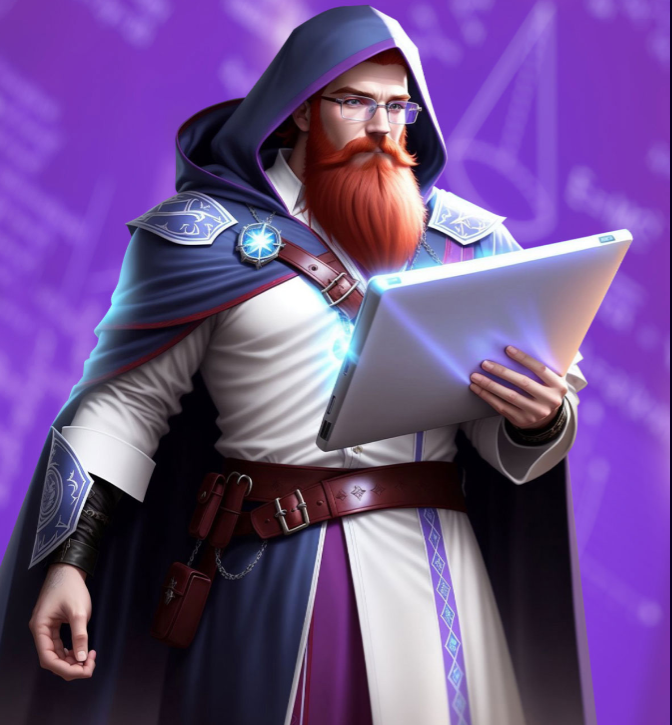

! Спасибо за внимание ! 